In [0]:
storage_account_access_key='XYl403PRLIdsg/6VOVj7atLqm2Sw5RIkXEuzO5pUVKfauT6eXC/Ztu98AX7LnUn4rp8+lUMy2IoD+AStMOI0wA=='
storage_account_name='datastoreversion1'

In [0]:
spark.conf.set(
  "fs.azure.account.key."+storage_account_name+".blob.core.windows.net",
  storage_account_access_key)

In [0]:
%pip install prophet

Python interpreter will be restarted.
  Created wheel for pymeeus: filename=PyMeeus-0.5.12-py3-none-any.whl size=732018 sha256=f16c9951566ae46344d61c247934aed6dd439ece3aa545bffffea2ebe5fa7e3d
  Stored in directory: /root/.cache/pip/wheels/04/1f/e5/8dd0c661cd8d252817655dc14a84f7ae045d6616594145aa81
Successfully built pymeeus
  Attempting uninstall: numpy
    Found existing installation: numpy 1.20.3
    Not uninstalling numpy at /databricks/python3/lib/python3.9/site-packages, outside environment /local_disk0/.ephemeral_nfs/envs/pythonEnv-869fb8a8-cf55-4e5b-8ea0-0f9bf0a9ad18
    Can't uninstall 'numpy'. No files were found to uninstall.
ERROR: pip's dependency resolver does not currently take into account all the packages that are installed. This behaviour is the source of the following dependency conflicts.
scipy 1.7.1 requires numpy<1.23.0,>=1.16.5, but you have numpy 1.25.2 which is incompatible.
Python interpreter will be restarted.


In [0]:
from prophet import Prophet
import pandas as pd

In [0]:
def forecast_store_item( history_pd: pd.DataFrame ) -> pd.DataFrame:
  
  # TRAIN MODEL AS BEFORE
  # --------------------------------------
  # remove missing values (more likely at day-store-item level)
  #history_pd = history_pd.dropna()
  
  # configure the model
  model = Prophet(
    interval_width=0.95,
    growth='linear',
    daily_seasonality=False,
    weekly_seasonality=True,
    yearly_seasonality=True,
    seasonality_mode='multiplicative'
    )
  
  # train the model
  model.fit( history_pd )
  # --------------------------------------
  
  # BUILD FORECAST AS BEFORE
  # --------------------------------------
  # make predictions
  future_pd = model.make_future_dataframe(
    periods=90, 
    freq='d', 
    include_history=True
    )
  forecast_pd = model.predict( future_pd )  
  
  # --------------------------------------
  
  # ASSEMBLE EXPECTED RESULT SET
  # --------------------------------------
  # get relevant fields from forecast
  f_pd = forecast_pd[ ['ds','yhat', 'yhat_upper', 'yhat_lower'] ].set_index('ds')
  
  # get relevant fields from history
  h_pd = history_pd[['ds','store','item','y']].set_index('ds')
  
  # join history and forecast
  results_pd = f_pd.join( h_pd, how='left' )
  results_pd.reset_index(level=0, inplace=True)
  
  # get store & item from incoming data set
  results_pd['store'] = history_pd['store'].iloc[0]
  results_pd['item'] = history_pd['item'].iloc[0]
  # --------------------------------------
  
  # return expected dataset
  return results_pd[ ['ds', 'store', 'item', 'y', 'yhat', 'yhat_upper', 'yhat_lower'] ]  

In [0]:
def forecast_season_item( history_pd: pd.DataFrame ) -> pd.DataFrame:
  
  # TRAIN MODEL AS BEFORE
  # --------------------------------------
  # remove missing values (more likely at day-store-item level)
  #history_pd = history_pd.dropna()
  
  # configure the model
  model = Prophet(
    interval_width=0.95,
    growth='linear',
    daily_seasonality=False,
    weekly_seasonality=True,
    yearly_seasonality=True,
    seasonality_mode='multiplicative'
    )
  
  # train the model
  model.fit( history_pd )
  # --------------------------------------
  
  # BUILD FORECAST AS BEFORE
  # --------------------------------------
  # make predictions
  future_pd = model.make_future_dataframe(
    periods=90, 
    freq='d', 
    include_history=True
    )
  forecast_pd = model.predict( future_pd )  
  # --------------------------------------
  
  # ASSEMBLE EXPECTED RESULT SET
  # --------------------------------------
  # get relevant fields from forecast
  f_pd = forecast_pd[ ['ds','yhat', 'yhat_upper', 'yhat_lower'] ].set_index('ds')
  
  # get relevant fields from history
  h_pd = history_pd[['ds','season','item','y']].set_index('ds')
  
  # join history and forecast
  results_pd = f_pd.join( h_pd, how='left' )
  results_pd.reset_index(level=0, inplace=True)
  
  # get store & item from incoming data set
  results_pd['season'] = history_pd['season'].iloc[0]
  results_pd['item'] = history_pd['item'].iloc[0]
  # --------------------------------------
  
  # return expected dataset
  return results_pd[ ['ds', 'season', 'item', 'y', 'yhat', 'yhat_upper', 'yhat_lower'] ]  

In [0]:
def forecast_region_item( history_pd: pd.DataFrame ) -> pd.DataFrame:
  
  # TRAIN MODEL AS BEFORE
  # --------------------------------------
  # remove missing values (more likely at day-store-item level)
  #history_pd = history_pd.dropna()
  
  # configure the model
  model = Prophet(
    interval_width=0.95,
    growth='linear',
    daily_seasonality=False,
    weekly_seasonality=True,
    yearly_seasonality=True,
    seasonality_mode='multiplicative'
    )
  
  # train the model
  model.fit( history_pd )
  # --------------------------------------
  
  # BUILD FORECAST AS BEFORE
  # --------------------------------------
  # make predictions
  future_pd = model.make_future_dataframe(
    periods=90, 
    freq='d', 
    include_history=True
    )
  forecast_pd = model.predict( future_pd )  
  # --------------------------------------
  
  # ASSEMBLE EXPECTED RESULT SET
  # --------------------------------------
  # get relevant fields from forecast
  f_pd = forecast_pd[ ['ds','yhat', 'yhat_upper', 'yhat_lower'] ].set_index('ds')
  
  # get relevant fields from history
  h_pd = history_pd[['ds','region','item','y']].set_index('ds')
  
  # join history and forecast
  results_pd = f_pd.join( h_pd, how='left' )
  results_pd.reset_index(level=0, inplace=True)
  
  # get store & item from incoming data set
  results_pd['region'] = history_pd['region'].iloc[0]
  results_pd['item'] = history_pd['item'].iloc[0]
  # --------------------------------------
  
  # return expected dataset
  return results_pd[ ['ds', 'region', 'item', 'y', 'yhat', 'yhat_upper', 'yhat_lower'] ]  

In [0]:
spark_df = spark.read.option("inferSchema", "true").option("header", "true").csv('wasbs://data@datastoreversion1.blob.core.windows.net/sales_data_Season.csv')
spark_df.cache()

Out[4]: DataFrame[Invoice_date: date, Sales_quantity: int, Sales_value: double, Promo: string, Discount: double, Is_holiday: string, Holiday_ID: string, Customer_ID: int, Product_ID: int, Store_ID: int, Region: string, Season: string]

In [0]:
spark_df.count()

Out[36]: 8918000

In [0]:
spark_df.write.saveAsTable("Sales_Transaction_Src_Table")

In [0]:
display(spark_df.selectExpr("year(invoice_date)").distinct())

year(invoice_date)
2022
2023


In [0]:
from pyspark.sql.types import *
 
result_schema =StructType([
  StructField('ds',DateType()),
  StructField('store',LongType()),
  StructField('item',LongType()),
  StructField('y',DoubleType()),
  StructField('yhat',FloatType()),
  StructField('yhat_upper',FloatType()),
  StructField('yhat_lower',FloatType())
  ])

In [0]:
display(spark_df)

Invoice_date,Sales_quantity,Sales_value,Promo,Discount,Is_holiday,Holiday_ID,Customer_ID,Product_ID,Store_ID,Region,Season
2022-01-01,3,93.53677481045834,No,0.0,No,null,377,86,3,North,Winter
2022-01-01,8,309.75161480066294,Yes,0.24621946758839403,No,null,419,33,10,West,Autumn
2022-01-01,8,351.52838894138137,No,0.0,No,null,245,9,3,North,Winter
2022-01-01,3,115.12849852644399,No,0.0,No,null,395,48,5,West,Winter
2022-01-01,7,136.4116308943678,Yes,0.4167121537117895,No,null,845,27,7,East,Winter
2022-01-01,14,244.097076065441,Yes,0.16590007486162478,No,null,185,65,9,North,Autumn
2022-01-01,19,382.28394983140004,No,0.0,No,null,298,93,6,East,Winter
2022-01-01,3,73.63425186092728,Yes,0.4036841762301884,No,null,150,11,7,East,Winter
2022-01-01,19,631.4084246464988,Yes,0.2617130389370814,No,null,237,47,1,West,Winter
2022-01-01,10,207.83455698417123,Yes,0.40483161822878244,No,null,889,23,5,North,Winter


In [0]:
from pyspark.sql.functions import *
history_pd=spark_df.selectExpr('store_id as store', 'product_id as item',"invoice_date as ds","Sales_value as y")#.limit(1000000)#.withColumn('ds', to_date(date_format('ds',
#"dd-MM-yyyy")))
#history_pd=history_pd.filter(col('store')!= 'All stores').union(history_pd.filter(col("store")!= 'All stores')).union(history_pd.filter(col("store")!= 'All stores'))

In [0]:
display(history_pd.groupBy('store', 'item').count().orderBy(col("count").desc()))

store,item,count
1,94,9209
5,93,9194
6,99,9178
10,34,9178
9,37,9164
10,32,9162
3,19,9159
6,14,9146
6,3,9145
8,40,9143


In [0]:
results = (
    history_pd
        .groupBy('store', 'item')
          .applyInPandas(forecast_store_item, schema=result_schema)
        .withColumn('training_date', current_date())
    )

In [0]:
results

Out[11]: DataFrame[ds: date, store: bigint, item: bigint, y: double, yhat: float, yhat_upper: float, yhat_lower: float, training_date: date]

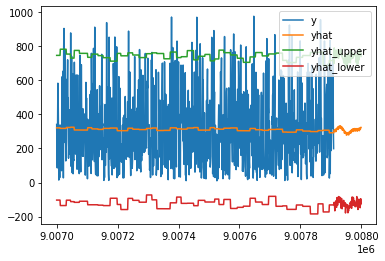

In [0]:
import matplotlib.pyplot as plt
import pandas as pd
pandas_df = results[['y', 'yhat', 'yhat_upper', 'yhat_lower']].toPandas()

# Plotting using Pandas and Matplotlib
pandas_df[-1000:].plot()
plt.show()


In [0]:
results.write.saveAsTable("Sales_Prediction_Table")

In [0]:
display(results)

ds,store,item,y,yhat,yhat_upper,yhat_lower,training_date
2022-01-01,1,1,619.5649582253361,327.03564,767.2908,-125.255066,2023-07-25
2022-01-01,1,1,148.50245144127874,327.03564,767.2908,-125.255066,2023-07-25
2022-01-01,1,1,26.672982422348813,327.03564,767.2908,-125.255066,2023-07-25
2022-01-01,1,1,22.966847490636816,327.03564,767.2908,-125.255066,2023-07-25
2022-01-01,1,1,466.0675612123714,327.03564,767.2908,-125.255066,2023-07-25
2022-01-01,1,1,120.48435928310877,327.03564,767.2908,-125.255066,2023-07-25
2022-01-01,1,1,501.0708248546885,327.03564,767.2908,-125.255066,2023-07-25
2022-01-01,1,1,537.1513980379651,327.03564,767.2908,-125.255066,2023-07-25
2022-01-01,1,1,300.7053449447858,327.03564,767.2908,-125.255066,2023-07-25
2022-01-01,1,1,824.527037566246,327.03564,767.2908,-125.255066,2023-07-25


In [0]:
display(results.groupBy("store","item").agg(sum("yhat").alias("yhat")).orderBy(col("yhat").desc()).limit(5))

store,item,yhat
3,44,2943801.284423828
9,54,2943309.4315185547
5,93,2942948.2048339844
3,24,2927240.2771606445
8,40,2925685.1912231445


In [0]:
display(results.groupBy("store","item").agg(sum("yhat").alias("yhat")).orderBy(col("yhat").desc()).limit(5))

store,item,yhat
3,44,2943801.284423828
9,54,2943309.4315185547
5,93,2942948.2048339844
3,24,2927240.2771606445
8,40,2925685.1912231445


In [0]:
top5storeitemprediction=results.groupBy("store","item").agg(sum("yhat").alias("yhat")).orderBy(col("yhat").desc()).limit(5)
top5storeitemprediction.write.saveAsTable("Sales_Prediction_Top5StoreItem_Table")

In [0]:
display(spark_df.select("season").dropDuplicates())

season
Spring
Summer
Autumn
Winter


In [0]:
season_mapping_df= broadcast(spark.createDataFrame([['Spring',1],['Summer',2],['Autumn',3],['Winter',4]],['season','id']))

In [0]:
season_df = spark_df.join(season_mapping_df,['season'],'inner').withColumnRenamed('season','season_name').withColumnRenamed('id','season')

In [0]:
from pyspark.sql.types import *
 
result_schema_season =StructType([
  StructField('ds',DateType()),
  StructField('season',LongType()),
  StructField('item',LongType()),
  StructField('y',DoubleType()),
  StructField('yhat',FloatType()),
  StructField('yhat_upper',FloatType()),
  StructField('yhat_lower',FloatType())
  ])

In [0]:
from pyspark.sql.functions import *
history_pd_season=season_df.selectExpr('season', 'product_id as item',"invoice_date as ds","Sales_value as y")

In [0]:
results_season = (
    history_pd_season
        .groupBy('season', 'item')
          .applyInPandas(forecast_season_item, schema=result_schema_season)
        .withColumn('training_date', current_date())#.withColumnRenamed("store","season")
    )

In [0]:
results_season.write.saveAsTable("Sales_Prediction_Session_Table")

In [0]:
display(results_season)

ds,season,item,y,yhat,yhat_upper,yhat_lower,training_date
2022-01-01,1,1,303.932635635425,319.4661,755.691,-128.68416,2023-07-25
2022-01-01,1,1,214.65771907901348,319.4661,755.691,-128.68416,2023-07-25
2022-01-01,1,1,390.5113556989962,319.4661,755.691,-128.68416,2023-07-25
2022-01-01,1,1,225.22900327995174,319.4661,755.691,-128.68416,2023-07-25
2022-01-01,1,1,26.672982422348813,319.4661,755.691,-128.68416,2023-07-25
2022-01-01,1,1,47.580189437465386,319.4661,755.691,-128.68416,2023-07-25
2022-01-01,1,1,40.69395310206713,319.4661,755.691,-128.68416,2023-07-25
2022-01-01,1,1,244.7491084391443,319.4661,755.691,-128.68416,2023-07-25
2022-01-01,1,1,421.6035726007746,319.4661,755.691,-128.68416,2023-07-25
2022-01-01,1,1,120.48435928310877,319.4661,755.691,-128.68416,2023-07-25


In [0]:
display(results_season.groupBy("season","item").agg(sum("yhat").alias("yhat")).orderBy(col("yhat").desc()).limit(5))

season,item,yhat
4,76,7208494.477355957
2,32,7198058.606018066
4,54,7192842.927520752
4,68,7185395.511291504
1,68,7181555.179595947


In [0]:
Top5SessionItemPrediction=results_season.groupBy("season","item").agg(sum("yhat").alias("yhat")).orderBy(col("yhat").desc()).limit(5)
Top5SessionItemPrediction.write.saveAsTable("Sales_Prediction_Session_Top5Table")

In [0]:
display(spark_df.select("region").dropDuplicates())

region
South
East
West
North


In [0]:
region_mapping_df= broadcast(spark.createDataFrame([['North',1],['East',2],['South',3],['West',4]],['region','id']))

In [0]:
region_df = spark_df.join(region_mapping_df,['region'],'inner').withColumnRenamed('region','region_name').withColumnRenamed('id','region')

In [0]:
from pyspark.sql.types import *
 
result_schema_region =StructType([
  StructField('ds',DateType()),
  StructField('region',LongType()),
  StructField('item',LongType()),
  StructField('y',DoubleType()),
  StructField('yhat',FloatType()),
  StructField('yhat_upper',FloatType()),
  StructField('yhat_lower',FloatType())
  ])

In [0]:
from pyspark.sql.functions import *
history_pd_season=region_df.selectExpr('region', 'product_id as item',"invoice_date as ds","Sales_value as y")

In [0]:
results_region = (
    history_pd_season
        .groupBy('region', 'item')
          .applyInPandas(forecast_region_item, schema=result_schema_region)
        .withColumn('training_date', current_date())#.withColumnRenamed("store","season")
    )

In [0]:
display(results_region)

ds,region,item,y,yhat,yhat_upper,yhat_lower,training_date
2022-01-01,1,1,214.65771907901348,325.27356,761.4826,-122.86051,2023-07-25
2022-01-01,1,1,390.5113556989962,325.27356,761.4826,-122.86051,2023-07-25
2022-01-01,1,1,148.50245144127874,325.27356,761.4826,-122.86051,2023-07-25
2022-01-01,1,1,225.22900327995174,325.27356,761.4826,-122.86051,2023-07-25
2022-01-01,1,1,372.87472278593356,325.27356,761.4826,-122.86051,2023-07-25
2022-01-01,1,1,56.04828314409608,325.27356,761.4826,-122.86051,2023-07-25
2022-01-01,1,1,91.92810536878514,325.27356,761.4826,-122.86051,2023-07-25
2022-01-01,1,1,71.70870743283768,325.27356,761.4826,-122.86051,2023-07-25
2022-01-01,1,1,145.63587922363885,325.27356,761.4826,-122.86051,2023-07-25
2022-01-01,1,1,160.70805741314757,325.27356,761.4826,-122.86051,2023-07-25


In [0]:
display(results_region.groupBy("region","item").agg(sum("yhat").alias("yhat")).orderBy(col("yhat").desc()).limit(5))

region,item,yhat
3,86,7263646.066345215
1,24,7199489.7855529785
4,47,7179601.2417907715
3,92,7170554.009521484
4,3,7168991.38684082


In [0]:
results_region.write.saveAsTable("Sales_Prediction_Region_Table")

In [0]:
Top5regionItem=results_region.groupBy("region","item").agg(sum("yhat").alias("yhat")).orderBy(col("yhat").desc()).limit(5)
Top5regionItem.write.saveAsTable("Sales_Prediction_SessionTop5_Table")

In [0]:
#display(results_region.groupBy("region","item").agg(sum("yhat").alias("yhat")).orderBy(col("yhat").desc()).limit(5))

season,item,yhat
4,76,7208494.477355957
2,32,7198058.606018066
4,54,7192842.927520752
4,68,7185395.511291504
1,68,7181555.179595947


In [0]:
# configure the model
#model = Prophet(
#interval_width=0.95,
#growth='linear',
#daily_seasonality=False,
#weekly_seasonality=True,
#yearly_seasonality=True,
#seasonality_mode='multiplicative'
#)
  

In [0]:
# train the model
#model.fit( history_pd.toPandas() )

---------------------------------------------------------------------------
The Python process exited with exit code 137 (SIGKILL: Killed). This may have been caused by an OOM error. Check your command's memory usage.

---------------------------------------------------------------------------
The last 10 KB of the process's stderr and stdout can be found below. See driver logs for full logs.
---------------------------------------------------------------------------
Last messages on stderr:
Mon Jul 24 12:21:12 2023 Connection to spark from PID  5725
Mon Jul 24 12:21:12 2023 Initialized gateway on port 33697
Mon Jul 24 12:21:13 2023 Connected to spark.
---------------------------------------------------------------------------
Last messages on stdout:
NOTE: When using the `ipython kernel` entry point, Ctrl-C will not work.

To exit, you will have to explicitly quit this process, by either sending
"quit" from a client, or using Ctrl-\ in UNIX-like environments.

To read more about this,

In [0]:
# define a dataset including both historical dates & 90-days beyond the last available date
#future_pd = model.make_future_dataframe(
 # periods=30, 
  #freq='d', 
  #include_history=False
  #)
 
# predict over the dataset
#forecast_pd = model.predict(future_pd)
 
#display(forecast_pd)

---------------------------------------------------------------------------
NameError                                 Traceback (most recent call last)
<command-3369746758935420> in <cell line: 2>()
      1 # define a dataset including both historical dates & 90-days beyond the last available date
----> 2 future_pd = model.make_future_dataframe(
      3   periods=30,
      4   freq='d',
      5   include_history=False

NameError: name 'model' is not defined

In [0]:
#forecast_pd

---------------------------------------------------------------------------
NameError                                 Traceback (most recent call last)
<command-3369746758935421> in <cell line: 1>()
----> 1 forecast_pd

NameError: name 'forecast_pd' is not defined

In [0]:
#predict_fig = model.plot( forecast_pd, xlabel='date', ylabel='sales')
 
# adjust figure to display dates from last year + the 90 day forecast
#xlim = predict_fig.axes[0].get_xlim()
#new_xlim = ( xlim[1]-(180.0), xlim[1]-90.0)
#predict_fig.axes[0].set_xlim(new_xlim)
 
#display(predict_fig)

---------------------------------------------------------------------------
NameError                                 Traceback (most recent call last)
<command-3369746758935422> in <cell line: 1>()
----> 1 predict_fig = model.plot( forecast_pd, xlabel='date', ylabel='sales')
      2 
      3 # adjust figure to display dates from last year + the 90 day forecast
      4 xlim = predict_fig.axes[0].get_xlim()
      5 new_xlim = ( xlim[1]-(180.0), xlim[1]-90.0)

NameError: name 'model' is not defined